### **Data Science**
Comisión 29800

Estudiante: Alejandro E. Leguizamón

> # **API**: *DATA ACQUISITION Y DATA WRANGLING*

# **CONTAMINACIÓN EN EE. UU. 2021** 🏭

Nos encontramos que en nuestro Dataset original faltaban registros de los ultimos dos meses del año 2021 y las coordenadas (Latitud y Longitud) de los puntos de muestreo para poder realizar graficas con mapas. 

Por lo tanto se decide utilizar extraer los datos faltantes de la API Bigquery, el cual contiene datos publicos.


**Fuente**: https://console.cloud.google.com/marketplace/product/epa/historical-air-quality

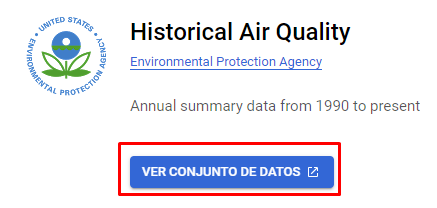

**DESCRIPCIÓN GENERAL**

La Agencia de Protección Ambiental de los Estados Unidos (EPA) protege tanto la salud pública como el medio ambiente al establecer los estándares para la calidad del aire nacional. La EPA proporciona datos resumidos anuales, así como datos horarios y diarios en las categorías de gases de criterio, partículas, meteorológicos y tóxicos.

Estos conjuntos de datos incluyen mediciones que comenzaron en 1990 y se actualizan dos veces al año. En junio se actualizan los datos completos del año anterior y en diciembre se actualizan los datos de verano.

Este conjunto de datos público está alojado en Google BigQuery y está incluido en el procesamiento de nivel gratuito de 1 TB/mes de BigQuery. Esto significa que cada usuario recibe 1 TB de procesamiento gratuito de BigQuery cada mes, que se puede usar para ejecutar consultas en este conjunto de datos público. Mire este breve video para obtener información sobre cómo comenzar rápidamente a usar BigQuery para acceder a conjuntos de datos públicos.

**EJEMPLOS**

Estos son algunos ejemplos de consultas SQL que puede ejecutar en estos datos en BigQuery.

**¿Cuáles son los sitios de monitoreo de la calidad del aire locales en Mountain View, California?**

Esta consulta recupera sitios de monitoreo de la calidad del aire cerca de Mountain View, California. Ejecutar esta consulta .

**¿Cuál fue la distribución de la calidad del aire de Los Ángeles en 2015?**

El índice de calidad del aire (AQI) es una clasificación de seguridad basada en colores basada en 5 contaminantes críticos regulados por la Ley de Aire Limpio . La siguiente consulta muestra la distribución de días en cada categoría para Los Ángeles en 2015. Ejecute esta consulta .

In [ ]:
#Importamos las librerias pandas y numpy que se utilizarán para generar el DataFrame con los registros faltantes
import pandas as pd 
import numpy as np 

In [ ]:
from google.colab import auth #Importamos libreria para generar autenticado para acceder a la base de datos
auth.authenticate_user()
print('Authenticated')

Authenticated


## **DATAFRAME: *pollution2*** 🏭


### **DATA ACQUISITION** 



In [ ]:
%%bigquery --project pollution-361815 df
SELECT 
  COUNT(*) as total_rows
FROM `bigquery-public-data.samples.gsod` #Seleccionamos que Dataset vamos a utilizar del API. En este caso Historical Air Quality

Los datos de cada contaminantes se encuentran en distintas tablas del Dataset público. 

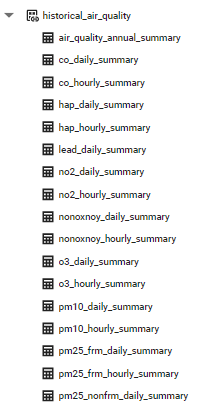

Por lo tanto se extraerán cada una y luego se realizará un *merge* entre los DataFrame obtenidos para unficarlos (*pollution2*), y luego concatenaremos con nuestro Dataset original (*pollution*). 

#### **Carbon monoxide (CO)**




In [ ]:
%%bigquery --project pollution-361815 CO_api 
SELECT date_local, address,	latitude, longitude, state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.co_daily_summary`
WHERE date_local BETWEEN '2021-11-01' AND '2021-12-31' 
#Filtramos para ver los datos desde el 2021-11-01 ya que nuestro dataset original tiene registro hasta el 2021-10-31

In [ ]:
CO_api.info() #Verificamos como está compuesto el DataFrame 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28345 entries, 0 to 28344
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       28345 non-null  object 
 1   address          28345 non-null  object 
 2   latitude         28345 non-null  float64
 3   longitude        28345 non-null  float64
 4   state_name       28345 non-null  object 
 5   county_name      28345 non-null  object 
 6   city_name        28345 non-null  object 
 7   arithmetic_mean  28345 non-null  float64
 8   first_max_value  28345 non-null  float64
 9   first_max_hour   28345 non-null  int64  
 10  aqi              14173 non-null  float64
dtypes: float64(5), int64(1), object(5)
memory usage: 2.4+ MB


In [ ]:
CO_api.date_local = pd.to_datetime(CO_api.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
CO_api['Year'] = CO_api['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
CO_api['Month'] = CO_api['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
CO_api['Day'] = CO_api['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
CO_api= CO_api[['date_local',	'Year', 'Month',	'Day', 'address',	'state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi', 'latitude', 'longitude']]
#Reordenamos las columnas para concatenarlas con el DataFrame original

In [ ]:
CO_api.columns = ['Date','Year','Month','Day', 'Address','State','County','City','CO Mean','CO 1st Max Value','CO 1st Max Hour','CO AQI', 'Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', CO_api.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                28345
Year                28345
Month               28345
Day                 28345
Address             28345
State               28345
County              28345
City                28345
CO Mean             28345
CO 1st Max Value    28345
CO 1st Max Hour     28345
CO AQI              14173
Latitude            28345
Longitude           28345
dtype: int64


In [ ]:
CO_api.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
CO_api.isnull().sum() #Vemos cuantos valores nulos existen

Date                    0
Year                    0
Month                   0
Day                     0
Address                 0
State                   0
County                  0
City                    0
CO Mean                 0
CO 1st Max Value        0
CO 1st Max Hour         0
CO AQI              14172
Latitude                0
Longitude               0
dtype: int64

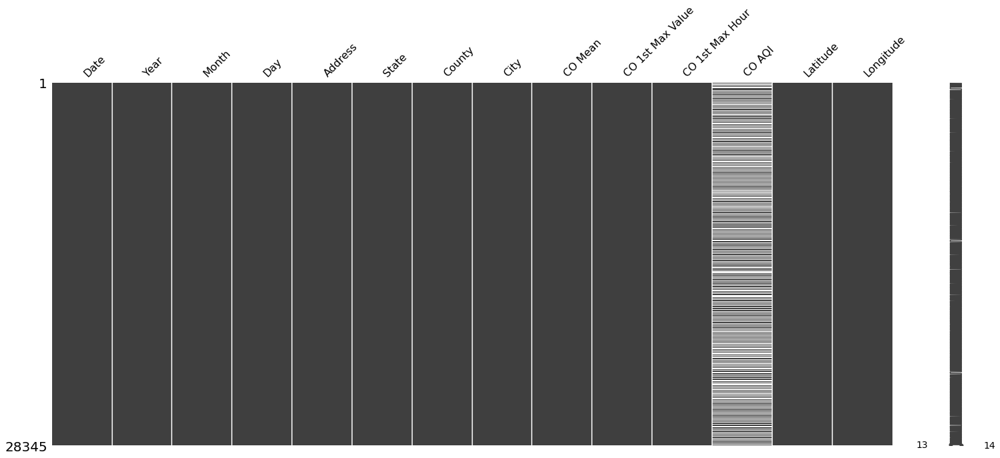

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(CO_api)

**Observamos que en la columna *CO AQI* tenemos muchos valores nulos que tenemos que tratar.**

In [ ]:
CO_api ['CO AQI'] = CO_api.groupby(['Month', 'City'])['CO AQI']\
    .transform(lambda x: x.fillna(x.mean()))

**Se reemplaza los valores nulos por el promedio de cada contaminante considerando:**

*   **Mes**
*   **Ciudad**

**No se pudo reemplazar los valores nulos por el valor del dia anterior como se hizo en nuestro dataset original, ya que existian muchos valores nulos continuados. Por lo cual la mejora manera fue sacando el promedio.**

In [ ]:
CO_api.isnull().values.any() #Verificamos si aun existen valores nulos

False

#### **Nitrogen dioxide (NO2)** 

In [ ]:
%%bigquery --project pollution-361815 NO2_api
SELECT date_local, address,latitude, longitude,	state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.no2_daily_summary`
WHERE date_local BETWEEN '2021-11-01' AND '2021-12-31' 
#Filtramos para ver los datos desde el 2021-11-01 ya que nuestro dataset original tiene registro hasta el 2021-10-31

In [ ]:
NO2_api.info() #Verificamos como está compuesto el DataFrame 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26156 entries, 0 to 26155
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       26156 non-null  object 
 1   address          26095 non-null  object 
 2   latitude         26156 non-null  float64
 3   longitude        26156 non-null  float64
 4   state_name       26156 non-null  object 
 5   county_name      26156 non-null  object 
 6   city_name        26156 non-null  object 
 7   arithmetic_mean  26156 non-null  float64
 8   first_max_value  26156 non-null  float64
 9   first_max_hour   26156 non-null  int64  
 10  aqi              26156 non-null  int64  
dtypes: float64(4), int64(2), object(5)
memory usage: 2.2+ MB


In [ ]:
NO2_api.date_local = pd.to_datetime(NO2_api.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
NO2_api['Year'] = NO2_api['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
NO2_api['Month'] = NO2_api['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
NO2_api['Day'] = NO2_api['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
NO2_api= NO2_api[['date_local',	'Year', 'Month',	'Day',	'address','state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi','latitude','longitude']]
#Reordenamos las columnas para concatenarlas con el DataFrame original

In [ ]:
NO2_api.columns = ['Date','Year','Month','Day', 'Address','State','County','City','NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','NO2 AQI','Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', NO2_api.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                 26156
Year                 26156
Month                26156
Day                  26156
Address              26095
State                26156
County               26156
City                 26156
NO2 Mean             26156
NO2 1st Max Value    26156
NO2 1st Max Hour     26156
NO2 AQI              26156
Latitude             26156
Longitude            26156
dtype: int64


In [ ]:
NO2_api.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
NO2_api.isnull().sum() #Vemos cuantos valores nulos existen

Date                  0
Year                  0
Month                 0
Day                   0
Address              61
State                 0
County                0
City                  0
NO2 Mean              0
NO2 1st Max Value     0
NO2 1st Max Hour      0
NO2 AQI               0
Latitude              0
Longitude             0
dtype: int64

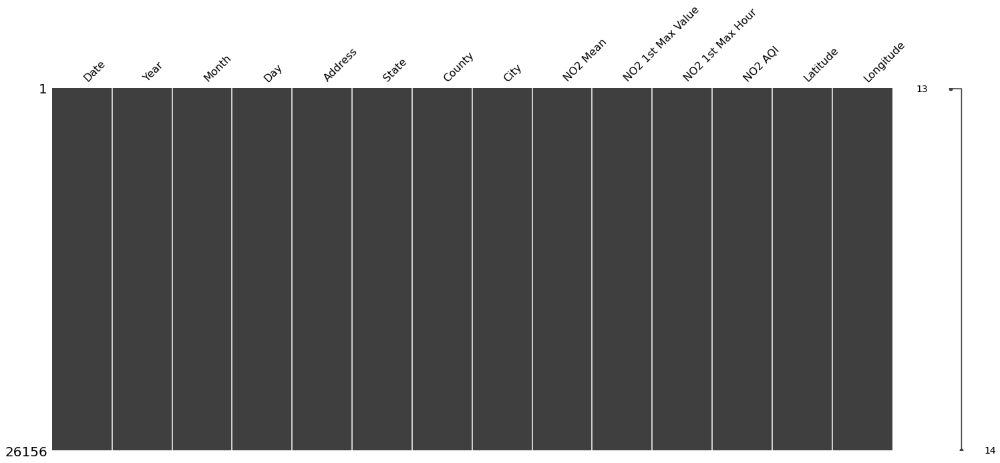

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(NO2_api)

**Observamos que en la columna *Address* tenemos muchos valores nulos que tenemos que reenombrar.**

In [ ]:
NO2_api= NO2_api.fillna('None Address')

**Para este caso, solo vamos a renombrar con *None Address* los pocos valores nulos (61) para que nuestro DataFrame no lo reconozca como tal.**

In [ ]:
NO2_api.isnull().values.any() #Verificamos si aun existen valores nulos

False

#### **Ozone (O3)**

In [ ]:
%%bigquery --project pollution-361815 O3_api
SELECT date_local, address,	latitude, longitude,state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi  	 FROM `pollution-361815.historical_air_quality.o3_daily_summary`
WHERE date_local BETWEEN '2021-11-01' AND '2021-12-31' 
#Filtramos para ver los datos desde el 2021-11-01 ya que nuestro dataset original tiene registro hasta el 2021-10-31

In [ ]:
O3_api.info() #Verificamos como está compuesto el DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45792 entries, 0 to 45791
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       45792 non-null  object 
 1   address          45731 non-null  object 
 2   latitude         45792 non-null  float64
 3   longitude        45792 non-null  float64
 4   state_name       45792 non-null  object 
 5   county_name      45792 non-null  object 
 6   city_name        45792 non-null  object 
 7   arithmetic_mean  45792 non-null  float64
 8   first_max_value  45792 non-null  float64
 9   first_max_hour   45792 non-null  int64  
 10  aqi              45792 non-null  int64  
dtypes: float64(4), int64(2), object(5)
memory usage: 3.8+ MB


In [ ]:
O3_api.date_local = pd.to_datetime(O3_api.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
O3_api['Year'] = O3_api['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
O3_api['Month'] = O3_api['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
O3_api['Day'] = O3_api['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
O3_api= O3_api[['date_local',	'Year', 'Month',	'Day', 'address',	'state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi','latitude', 'longitude']]
#Reordenamos las columnas para concatenarlas con el DataFrame original

In [ ]:
O3_api.columns = ['Date','Year','Month','Day', 'Address', 'State','County','City','O3 Mean','O3 1st Max Value','O3 1st Max Hour','O3 AQI', 'Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', O3_api.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                45792
Year                45792
Month               45792
Day                 45792
Address             45731
State               45792
County              45792
City                45792
O3 Mean             45792
O3 1st Max Value    45792
O3 1st Max Hour     45792
O3 AQI              45792
Latitude            45792
Longitude           45792
dtype: int64


In [ ]:
O3_api.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
O3_api.isnull().sum() #Vemos cuantos valores nulos existen

Date                 0
Year                 0
Month                0
Day                  0
Address             61
State                0
County               0
City                 0
O3 Mean              0
O3 1st Max Value     0
O3 1st Max Hour      0
O3 AQI               0
Latitude             0
Longitude            0
dtype: int64

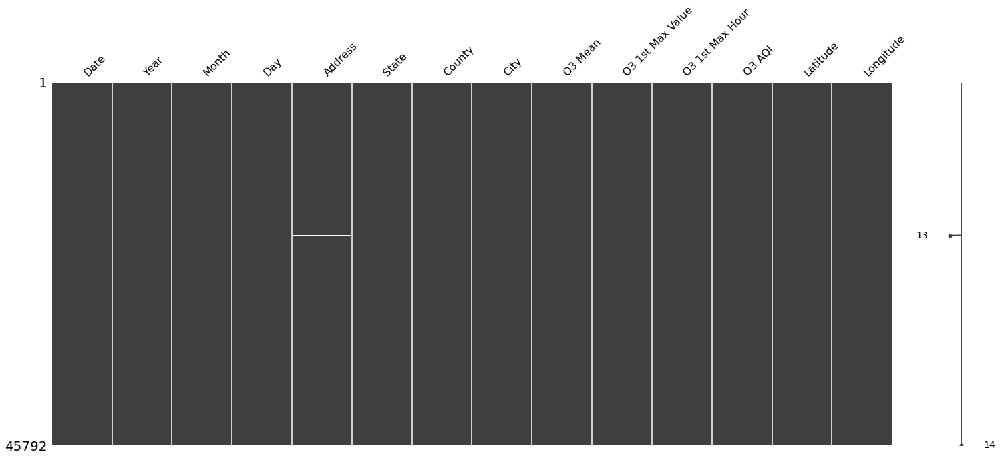

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(O3_api)

**Observamos que en la columna *Address* tenemos muchos valores nulos que tenemos que reenombrar.**

In [ ]:
O3_api= O3_api.fillna('None Address')

**Para este caso tambien, solo vamos a renombrar con *None Address* los pocos valores nulos (61) para que nuestro DataFrame no lo reconozca como tal.**

In [ ]:
O3_api.isnull().values.any() #Verificamos si aun existen valores nulos

False

#### **Sulfur dioxide (SO2)**

In [ ]:
%%bigquery --project pollution-361815 SO2_api
SELECT date_local, address,	latitude, longitude,state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.so2_daily_summary`
WHERE date_local BETWEEN '2021-11-01' AND '2021-12-31' 
#Filtramos para ver los datos desde el 2021-11-01 ya que nuestro dataset original tiene registro hasta el 2021-10-31

In [ ]:
SO2_api.info() #Verificamos como está compuesto el DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49759 entries, 0 to 49758
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       49759 non-null  object 
 1   address          49637 non-null  object 
 2   latitude         49759 non-null  float64
 3   longitude        49759 non-null  float64
 4   state_name       49759 non-null  object 
 5   county_name      49759 non-null  object 
 6   city_name        49759 non-null  object 
 7   arithmetic_mean  49759 non-null  float64
 8   first_max_value  49759 non-null  float64
 9   first_max_hour   49759 non-null  int64  
 10  aqi              24891 non-null  float64
dtypes: float64(5), int64(1), object(5)
memory usage: 4.2+ MB


In [ ]:
SO2_api.date_local = pd.to_datetime(SO2_api.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
SO2_api['Year'] = SO2_api['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
SO2_api['Month'] = SO2_api['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
SO2_api['Day'] = SO2_api['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
SO2_api= SO2_api[['date_local',	'Year', 'Month',	'Day', 'address','state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi',	'latitude', 'longitude']]
#Reordenamos las columnas para concatenarlas con el DataFrame original

In [ ]:
SO2_api.columns = ['Date','Year','Month','Day', 'Address','State','County','City','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','SO2 AQI','Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', SO2_api.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                 49759
Year                 49759
Month                49759
Day                  49759
Address              49637
State                49759
County               49759
City                 49759
SO2 Mean             49759
SO2 1st Max Value    49759
SO2 1st Max Hour     49759
SO2 AQI              24891
Latitude             49759
Longitude            49759
dtype: int64


In [ ]:
SO2_api.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
SO2_api.isnull().sum() #Vemos cuantos valores nulos existen

Date                     0
Year                     0
Month                    0
Day                      0
Address                122
State                    0
County                   0
City                     0
SO2 Mean                 0
SO2 1st Max Value        0
SO2 1st Max Hour         0
SO2 AQI              24868
Latitude                 0
Longitude                0
dtype: int64

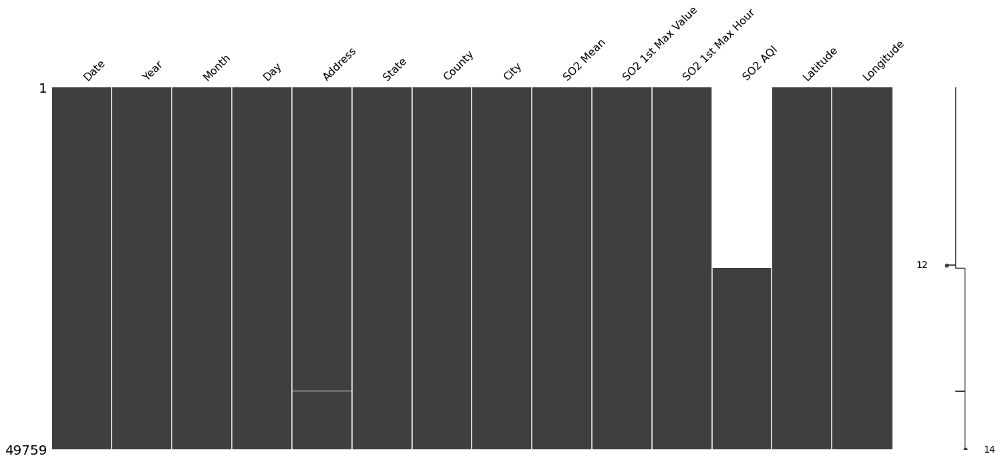

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(SO2_api)

**Observamos que en la columna *Address* tenemos muchos valores nulos que tenemos que reenombrar.**

In [ ]:
SO2_api.Address= SO2_api.Address.fillna('None Address')

**Para este caso tambien, solo vamos a renombrar con *None Address* los pocos valores nulos (122) para que nuestro DataFrame no lo reconozca como tal.**

**Tambien en la columna *SO2 AQI* encontramos falta de datos por un tiempo. Por lo tanto se decide eliminar ya que, si se reemplaza por el promedio, no seria representativo por la gran cantidad de datos faltantes.**

In [ ]:
SO2_api = SO2_api.dropna() #Eliminamos filas con valores nulos

In [ ]:
SO2_api.isnull().values.any() #Verificamos si aun existen valores nulos

False

### **DATA WRANGLING**

In [ ]:
dw1 = pd.merge(CO_api,NO2_api, on =['Date', 'Year', 'Month', 'Day', 'Address','State', 'County', 'City','Latitude', 'Longitude'],how= 'inner') 
# Unimos los dataframe CO_api y NO2_api mediante un inner 

In [ ]:
dw2 = pd.merge(O3_api,SO2_api, on =['Date', 'Year', 'Month', 'Day', 'Address','Latitude', 'Longitude', 'State', 'County', 'City'],how= 'inner')
# Unimos los dataframe O3_api y SO2_api mediante un inner 

In [ ]:
pollution2 = pd.merge(dw1,dw2, on =['Date', 'Year', 'Month', 'Day', 'Address', 'Latitude', 'Longitude','State', 'County', 'City'],how= 'inner')
pollution2.head(5)
# Unimos los dataframe dw1 y dw2 mediante un inner para obtener nuestro dataframe final 

,Date,Year,Month,Day,Address,State,County,City,CO Mean,CO 1st Max Value,...,NO2 1st Max Hour,NO2 AQI,O3 Mean,O3 1st Max Value,O3 1st Max Hour,O3 AQI,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI
0,2021-11-06,2021,11,6,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.587500,1.1,...,22,27,0.016353,0.030,11,28,0.926087,1.6,0,1.0
1,2021-11-06,2021,11,6,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.534783,1.1,...,22,27,0.016353,0.030,11,28,0.926087,1.6,0,1.0
2,2021-11-13,2021,11,13,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.558333,1.1,...,0,20,0.017176,0.027,9,25,0.834783,2.0,0,3.0
3,2021-11-13,2021,11,13,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.434783,1.0,...,0,20,0.017176,0.027,9,25,0.834783,2.0,0,3.0
4,2021-11-01,2021,11,1,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.282609,0.5,...,21,24,0.015882,0.028,9,26,0.656522,1.9,2,1.0


In [ ]:
pollution2= pollution2[['Date', 'Year', 'Month', 'Day', 'Address', 'State', 'County', 'City',
       'O3 Mean', 'O3 1st Max Value', 'O3 1st Max Hour', 'O3 AQI', 'CO Mean',
       'CO 1st Max Value', 'CO 1st Max Hour', 'CO AQI', 'SO2 Mean',
       'SO2 1st Max Value', 'SO2 1st Max Hour', 'SO2 AQI', 'NO2 Mean',
       'NO2 1st Max Value', 'NO2 1st Max Hour', 'NO2 AQI', 'Latitude', 'Longitude']]
  #Reordenamos las columnas para poder concatenar correctamente con el DataFrame original

In [ ]:
pollution2.shape

(9724, 26)

In [ ]:
pollution2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9724 entries, 0 to 9723
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               9724 non-null   datetime64[ns]
 1   Year               9724 non-null   int64         
 2   Month              9724 non-null   int64         
 3   Day                9724 non-null   int64         
 4   Address            9724 non-null   object        
 5   State              9724 non-null   object        
 6   County             9724 non-null   object        
 7   City               9724 non-null   object        
 8   O3 Mean            9724 non-null   float64       
 9   O3 1st Max Value   9724 non-null   float64       
 10  O3 1st Max Hour    9724 non-null   int64         
 11  O3 AQI             9724 non-null   int64         
 12  CO Mean            9724 non-null   float64       
 13  CO 1st Max Value   9724 non-null   float64       
 14  CO 1st M

In [ ]:
pollution2.isnull().values.any() #Verificamos si existen valores nulos

False

**Podemos observar que ya tenemos el dataframe *pollution2* con el mismo formato y estructura que nuestro dataframe original.**

**Por lo tanto ya podemos concatenarlos...**


In [ ]:
pollution2.to_csv('pollution2.csv', index=False) #Descargamos el dataframe en formato .csv

**LO DESCARGAMOS PARA SUBIRLO A GITHUB Y FACILITAR LA IMPORTACIÓN EN NUESTRO PROYECTO.**

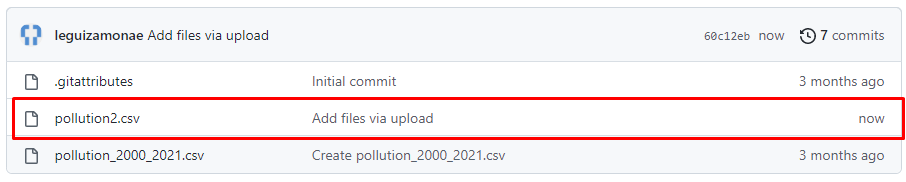

**Chequeamos importando el mismo Dataset pero directamente de Github**

In [ ]:
url = 'https://raw.githubusercontent.com/leguizamonae/Pollution/main/pollution2.csv' #Importamos Dataset cargado en Github
pollution2= pd.read_csv(url,sep=',')
pollution2.head()

,Date,Year,Month,Day,Address,State,County,City,O3 Mean,O3 1st Max Value,...,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI,NO2 Mean,NO2 1st Max Value,NO2 1st Max Hour,NO2 AQI,Latitude,Longitude
0,2021-11-06,2021,11,6,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.016353,0.030,...,0.926087,1.6,0,1.0,16.979167,29.9,22,27,39.991389,-75.080833
1,2021-11-06,2021,11,6,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.016353,0.030,...,0.926087,1.6,0,1.0,16.979167,29.9,22,27,39.991389,-75.080833
2,2021-11-13,2021,11,13,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.017176,0.027,...,0.834783,2.0,0,3.0,9.970833,21.5,0,20,39.991389,-75.080833
3,2021-11-13,2021,11,13,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.017176,0.027,...,0.834783,2.0,0,3.0,9.970833,21.5,0,20,39.991389,-75.080833
4,2021-11-01,2021,11,1,"3000 LEWIS ST. (NEAR BATH ST.) Philadelphia, P...",Pennsylvania,Philadelphia,Philadelphia,0.015882,0.028,...,0.656522,1.9,2,1.0,12.208333,25.8,21,24,39.991389,-75.080833


In [ ]:
pollution2.shape #Chequeamos que tenga la misma forma

(9724, 26)

## **DATAFRAME: *coordenadas*** 🧭

### **DATA ACQUISITION** 

In [ ]:
%%bigquery --project pollution-361815 CO_api 
SELECT address,	latitude, longitude FROM `pollution-361815.historical_air_quality.co_daily_summary`
WHERE date_local BETWEEN '2000-01-01' AND '2021-12-31' 

In [ ]:
%%bigquery --project pollution-361815 NO2_api
SELECT address,latitude, longitude FROM `pollution-361815.historical_air_quality.no2_daily_summary`
WHERE date_local BETWEEN '2000-01-01' AND '2021-12-31' 

In [ ]:
%%bigquery --project pollution-361815 O3_api
SELECT address,	latitude, longitude FROM `pollution-361815.historical_air_quality.o3_daily_summary`
WHERE date_local BETWEEN '2000-01-01' AND '2021-12-31' 

In [ ]:
%%bigquery --project pollution-361815 SO2_api
SELECT address,	latitude, longitude FROM `pollution-361815.historical_air_quality.so2_daily_summary`
WHERE date_local BETWEEN '2000-01-01' AND '2021-12-31' 

### **DATA WRANGLING**

In [ ]:
coordenadas = pd.concat([SO2_api, O3_api, NO2_api, CO_api],axis=0) #Concatenamos los dataframe generados
coordenadas= coordenadas.drop_duplicates(['address']) #Eliminamos los registros duplicados
coordenadas.count() #Contamos registros

address      2945
latitude     2946
longitude    2946
dtype: int64

In [ ]:
coordenadas.shape

(2946, 3)

In [ ]:
coordenadas.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2946 entries, 0 to 1413499
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   address    2945 non-null   object 
 1   latitude   2946 non-null   float64
 2   longitude  2946 non-null   float64
dtypes: float64(2), object(1)
memory usage: 92.1+ KB


In [ ]:
coordenadas.columns = ['Address','Latitude', 'Longitude'] #Reenombramos columnas 

In [ ]:
nueva_fila = {'Address':'2390-B Wildcat Road, Decatur GA 30034', 'Latitude':33.68640896395601, 'Longitude':-84.28852208539591}
 
#Se añade manualmente unica direccion faltante 
coordenadas = coordenadas.append(nueva_fila, ignore_index=True)

In [ ]:
coordenadas.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
coordenadas.isnull().sum() #Se encuentra solo un valor nulo

Address      1
Latitude     0
Longitude    0
dtype: int64

In [ ]:
coordenadas = coordenadas.dropna() #Eliminamos valor nulo

In [ ]:
coordenadas.isnull().values.any() #Verificamos si existen valores nulos

False

In [ ]:
coordenadas.shape

(2946, 3)

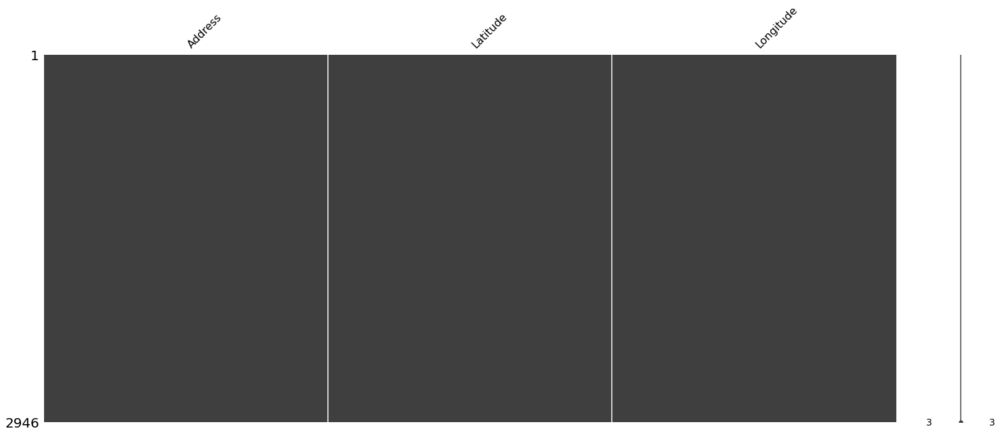

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(coordenadas)

**Ya tenemos el dataframe *coordenadas* para poder completar columnas *Latitude* y *Longitude* de nuestro dataframe original.**

In [ ]:
coordenadas.to_csv('coordenadas.csv', index=False) #Descargamos el dataframe en un archivo .csv

**LO DESCARGAMOS PARA SUBIRLO A GITHUB Y FACILITAR LA IMPORTACIÓN EN NUESTRO PROYECTO.**

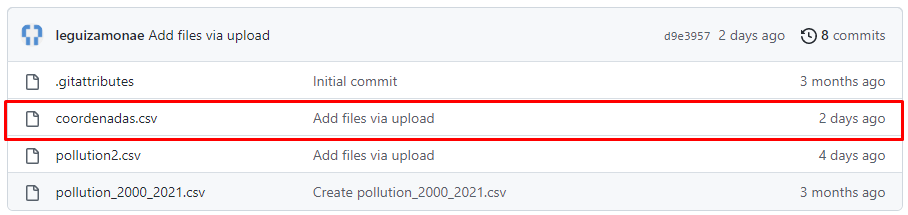

**Chequeamos importando el mismo Dataset pero directamente de Github**

In [ ]:
url = 'https://raw.githubusercontent.com/leguizamonae/Pollution/main/coordenadas.csv' 
#Se carga data set de Kaggle a github para facilitar la importación
coordenadas= pd.read_csv(url,sep=',')
coordenadas.head()

,Address,Latitude,Longitude
0,"BAY RD. ,MOBILE AL.",30.474305,-88.141022
1,"1029 ETHEL ST, CALEXICO HIGH SCHOOL",32.676180,-115.483070
2,"Corner of Athol and Telescope, Trona",35.774170,-117.371400
3,"84 E. 'J' ST., CHULA VISTA",32.631242,-117.059088
4,"330A 12TH AVE., SAN DIEGO, CA. 92112",32.709224,-117.154841


In [ ]:
coordenadas.shape #Chequeamos que tenga la misma forma

(2946, 3)

## **DATAFRAME: *pollution3*** 🏭


**El objetivo de este Dataframe es usarlo para probar y evaluar nuestro modelo de clasificación**

### **DATA ACQUISITION** 



**Esta vez utilizaremos la API de Bigquery de otra manera...**

In [ ]:
from google.colab import auth
from google.cloud import bigquery
from google.colab import data_table

project = 'pollution-361815' # Project ID inserted based on the query results selected to explore
location = 'US' # Location inserted based on the query results selected to explore
client = bigquery.Client(project=project, location=location)
data_table.enable_dataframe_formatter()
auth.authenticate_user()

Los datos de cada contaminantes se encuentran en distintas tablas del Dataset público. 

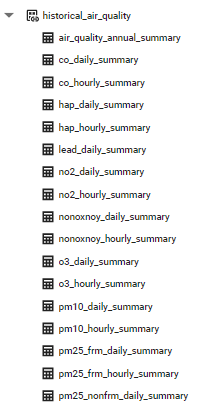

#### **Carbon monoxide (CO)**




In [ ]:
# Running this code will display the query used to generate your previous job

job = client.get_job('bquxjob_348afabb_18544fcbb4f') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT date_local, address,	latitude, longitude, state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.co_daily_summary`
WHERE date_local BETWEEN '2022-01-01' AND '2022-12-31' 


In [ ]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_348afabb_18544fcbb4f') # Job ID inserted based on the query results selected to explore
CO_api2 = job.to_dataframe()
CO_api2

,date_local,address,latitude,longitude,state_name,county_name,city_name,arithmetic_mean,first_max_value,first_max_hour,aqi
0,2022-01-18,1260-A Stewart St.,39.521933,-119.795400,Nevada,Washoe,Reno,0.782353,1.200,4,14
1,2022-01-01,1260-A Stewart St.,39.521933,-119.795400,Nevada,Washoe,Reno,0.259913,0.499,21,<NA>
2,2022-01-02,1260-A Stewart St.,39.521933,-119.795400,Nevada,Washoe,Reno,0.466522,1.110,22,<NA>
3,2022-01-03,1260-A Stewart St.,39.521933,-119.795400,Nevada,Washoe,Reno,0.287476,0.803,1,<NA>
4,2022-01-04,1260-A Stewart St.,39.521933,-119.795400,Nevada,Washoe,Reno,0.112875,0.144,13,<NA>
...,...,...,...,...,...,...,...,...,...,...,...
22531,2022-01-27,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,0.650000,1.000,1,11
22532,2022-02-01,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,0.687500,1.000,1,11
22533,2022-02-07,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,0.608333,1.000,7,11
22534,2022-02-15,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,0.695833,1.000,9,11


In [ ]:
CO_api2.info() #Verificamos como está compuesto el DataFrame 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22536 entries, 0 to 22535
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       22536 non-null  dbdate 
 1   address          22536 non-null  object 
 2   latitude         22536 non-null  float64
 3   longitude        22536 non-null  float64
 4   state_name       22536 non-null  object 
 5   county_name      22536 non-null  object 
 6   city_name        22536 non-null  object 
 7   arithmetic_mean  22536 non-null  float64
 8   first_max_value  22536 non-null  float64
 9   first_max_hour   22536 non-null  Int64  
 10  aqi              11326 non-null  Int64  
dtypes: Int64(2), dbdate(1), float64(4), object(4)
memory usage: 1.9+ MB


In [ ]:
CO_api2.date_local = pd.to_datetime(CO_api2.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
CO_api2['Year'] = CO_api2['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
CO_api2['Month'] = CO_api2['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
CO_api2['Day'] = CO_api2['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
CO_api2= CO_api2[['date_local',	'Year', 'Month',	'Day', 'address',	'state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi', 'latitude', 'longitude']]
#Reordenamos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
CO_api2.columns = ['Date','Year','Month','Day', 'Address','State','County','City','CO Mean','CO 1st Max Value','CO 1st Max Hour','CO AQI', 'Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', CO_api2.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                22536
Year                22536
Month               22536
Day                 22536
Address             22536
State               22536
County              22536
City                22536
CO Mean             22536
CO 1st Max Value    22536
CO 1st Max Hour     22536
CO AQI              11326
Latitude            22536
Longitude           22536
dtype: int64


In [ ]:
CO_api2.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
CO_api2.isnull().sum() #Vemos cuantos valores nulos existen

Date                    0
Year                    0
Month                   0
Day                     0
Address                 0
State                   0
County                  0
City                    0
CO Mean                 0
CO 1st Max Value        0
CO 1st Max Hour         0
CO AQI              11210
Latitude                0
Longitude               0
dtype: int64

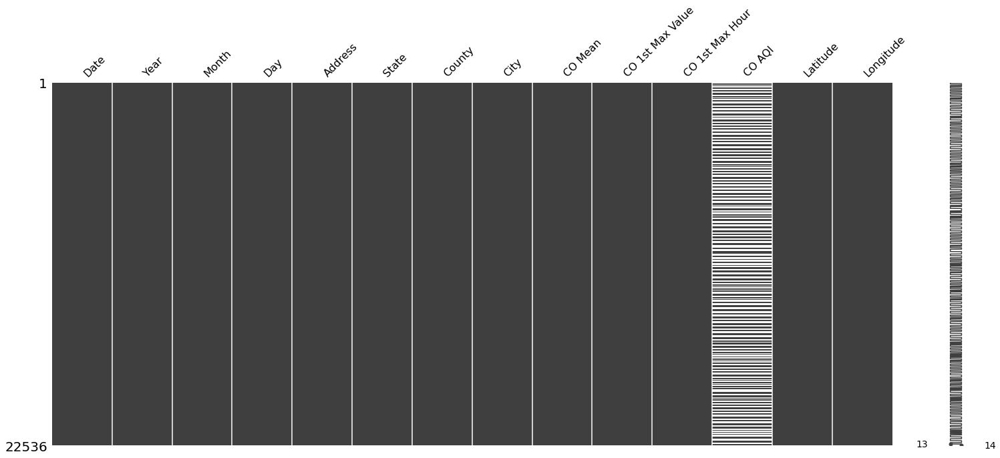

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(CO_api2)

**Observamos que en la columna *CO AQI* tenemos muchos valores nulos, los cuales no vamos tratar ya que solos los interesa las variables *CO Mean* y
*CO 1st Max Value* para nuestro modelo de clasificación.**

#### **Nitrogen dioxide (NO2)** 

In [ ]:
# Running this code will display the query used to generate your previous job

job = client.get_job('bquxjob_296fd988_1854509fead') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT date_local, address,latitude, longitude,	state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.no2_daily_summary`
WHERE date_local BETWEEN '2022-01-01' AND '2022-12-31' 


In [ ]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_296fd988_1854509fead') # Job ID inserted based on the query results selected to explore
NO2_api2 = job.to_dataframe()
NO2_api2

,date_local,address,latitude,longitude,state_name,county_name,city_name,arithmetic_mean,first_max_value,first_max_hour,aqi
0,2022-01-04,152 Hurricane Drive,36.511708,-77.655389,North Carolina,Northampton,Gaston,2.526316,4.6,20,4
1,2022-02-01,152 Hurricane Drive,36.511708,-77.655389,North Carolina,Northampton,Gaston,2.094737,4.6,20,4
2,2022-02-15,152 Hurricane Drive,36.511708,-77.655389,North Carolina,Northampton,Gaston,3.031579,5.3,3,5
3,2022-03-30,152 Hurricane Drive,36.511708,-77.655389,North Carolina,Northampton,Gaston,4.831579,16.1,20,15
4,2022-01-18,152 Hurricane Drive,36.511708,-77.655389,North Carolina,Northampton,Gaston,1.380000,2.1,16,2
...,...,...,...,...,...,...,...,...,...,...,...
18758,2022-03-25,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,10.666667,26.0,2,25
18759,2022-03-26,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,5.166667,12.0,0,11
18760,2022-03-27,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,7.375000,20.0,23,19
18761,2022-03-28,3428 COLERAIN AVE.,39.146025,-84.538375,Ohio,Hamilton,Cincinnati,24.500000,36.0,7,34


In [ ]:
NO2_api2.info() #Verificamos como está compuesto el DataFrame 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18763 entries, 0 to 18762
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       18763 non-null  dbdate 
 1   address          18763 non-null  object 
 2   latitude         18763 non-null  float64
 3   longitude        18763 non-null  float64
 4   state_name       18763 non-null  object 
 5   county_name      18763 non-null  object 
 6   city_name        18763 non-null  object 
 7   arithmetic_mean  18763 non-null  float64
 8   first_max_value  18763 non-null  float64
 9   first_max_hour   18763 non-null  Int64  
 10  aqi              18763 non-null  Int64  
dtypes: Int64(2), dbdate(1), float64(4), object(4)
memory usage: 1.6+ MB


In [ ]:
NO2_api2.date_local = pd.to_datetime(NO2_api2.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
NO2_api2['Year'] = NO2_api2['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
NO2_api2['Month'] = NO2_api2['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
NO2_api2['Day'] = NO2_api2['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
NO2_api2= NO2_api2[['date_local',	'Year', 'Month',	'Day',	'address','state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi','latitude','longitude']]
#Reordenamos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
NO2_api2.columns = ['Date','Year','Month','Day', 'Address','State','County','City','NO2 Mean','NO2 1st Max Value','NO2 1st Max Hour','NO2 AQI','Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', NO2_api2.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                 18763
Year                 18763
Month                18763
Day                  18763
Address              18763
State                18763
County               18763
City                 18763
NO2 Mean             18763
NO2 1st Max Value    18763
NO2 1st Max Hour     18763
NO2 AQI              18763
Latitude             18763
Longitude            18763
dtype: int64


In [ ]:
NO2_api2.isnull().values.any() #Verificamos si existen valores nulos

False

In [ ]:
NO2_api2.isnull().sum() #Vemos cuantos valores nulos existen

Date                 0
Year                 0
Month                0
Day                  0
Address              0
State                0
County               0
City                 0
NO2 Mean             0
NO2 1st Max Value    0
NO2 1st Max Hour     0
NO2 AQI              0
Latitude             0
Longitude            0
dtype: int64

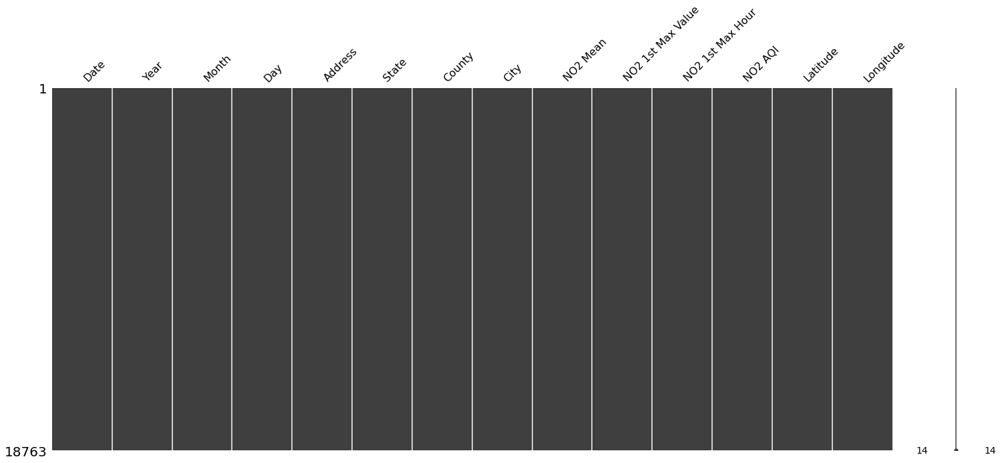

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(NO2_api2)

#### **Ozone (O3)**

In [ ]:
# Running this code will display the query used to generate your previous job

job = client.get_job('bquxjob_723ed694_185450d7dde') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT date_local, address,	latitude, longitude,state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi  	 FROM `pollution-361815.historical_air_quality.o3_daily_summary`
WHERE date_local BETWEEN '2022-01-01' AND '2022-12-31' 


In [ ]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_723ed694_185450d7dde') # Job ID inserted based on the query results selected to explore
O3_api2 = job.to_dataframe()
O3_api2

,date_local,address,latitude,longitude,state_name,county_name,city_name,arithmetic_mean,first_max_value,first_max_hour,aqi
0,2022-01-01,Sand Mountain Alabama Agricultural Experiment ...,34.289001,-85.970065,Alabama,DeKalb,Crossville,0.025059,0.028,22,26
1,2022-01-02,Sand Mountain Alabama Agricultural Experiment ...,34.289001,-85.970065,Alabama,DeKalb,Crossville,0.019176,0.025,7,23
2,2022-01-03,Sand Mountain Alabama Agricultural Experiment ...,34.289001,-85.970065,Alabama,DeKalb,Crossville,0.031765,0.034,8,31
3,2022-01-04,Sand Mountain Alabama Agricultural Experiment ...,34.289001,-85.970065,Alabama,DeKalb,Crossville,0.028529,0.031,13,29
4,2022-01-05,Sand Mountain Alabama Agricultural Experiment ...,34.289001,-85.970065,Alabama,DeKalb,Crossville,0.026471,0.035,10,32
...,...,...,...,...,...,...,...,...,...,...,...
43924,2022-03-27,YELLOWSTONE NATIONAL PARK,44.565360,-110.400340,Wyoming,Teton,Not in a city,0.046941,0.048,11,44
43925,2022-03-28,YELLOWSTONE NATIONAL PARK,44.565360,-110.400340,Wyoming,Teton,Not in a city,0.045471,0.048,9,44
43926,2022-03-29,YELLOWSTONE NATIONAL PARK,44.565360,-110.400340,Wyoming,Teton,Not in a city,0.040471,0.045,20,42
43927,2022-03-30,YELLOWSTONE NATIONAL PARK,44.565360,-110.400340,Wyoming,Teton,Not in a city,0.045529,0.047,17,44


In [ ]:
O3_api2.info() #Verificamos como está compuesto el DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43929 entries, 0 to 43928
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       43929 non-null  dbdate 
 1   address          43929 non-null  object 
 2   latitude         43929 non-null  float64
 3   longitude        43929 non-null  float64
 4   state_name       43929 non-null  object 
 5   county_name      43929 non-null  object 
 6   city_name        43929 non-null  object 
 7   arithmetic_mean  43929 non-null  float64
 8   first_max_value  43929 non-null  float64
 9   first_max_hour   43929 non-null  Int64  
 10  aqi              43929 non-null  Int64  
dtypes: Int64(2), dbdate(1), float64(4), object(4)
memory usage: 3.8+ MB


In [ ]:
O3_api2.date_local = pd.to_datetime(O3_api2.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
O3_api2['Year'] = O3_api2['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
O3_api2['Month'] = O3_api2['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
O3_api2['Day'] = O3_api2['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
O3_api2= O3_api2[['date_local',	'Year', 'Month',	'Day', 'address',	'state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi','latitude', 'longitude']]
#Reordenamos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
O3_api2.columns = ['Date','Year','Month','Day', 'Address', 'State','County','City','O3 Mean','O3 1st Max Value','O3 1st Max Hour','O3 AQI', 'Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', O3_api2.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                43929
Year                43929
Month               43929
Day                 43929
Address             43929
State               43929
County              43929
City                43929
O3 Mean             43929
O3 1st Max Value    43929
O3 1st Max Hour     43929
O3 AQI              43929
Latitude            43929
Longitude           43929
dtype: int64


In [ ]:
O3_api2.isnull().values.any() #Verificamos si existen valores nulos

False

In [ ]:
O3_api2.isnull().sum() #Vemos cuantos valores nulos existen

Date                0
Year                0
Month               0
Day                 0
Address             0
State               0
County              0
City                0
O3 Mean             0
O3 1st Max Value    0
O3 1st Max Hour     0
O3 AQI              0
Latitude            0
Longitude           0
dtype: int64

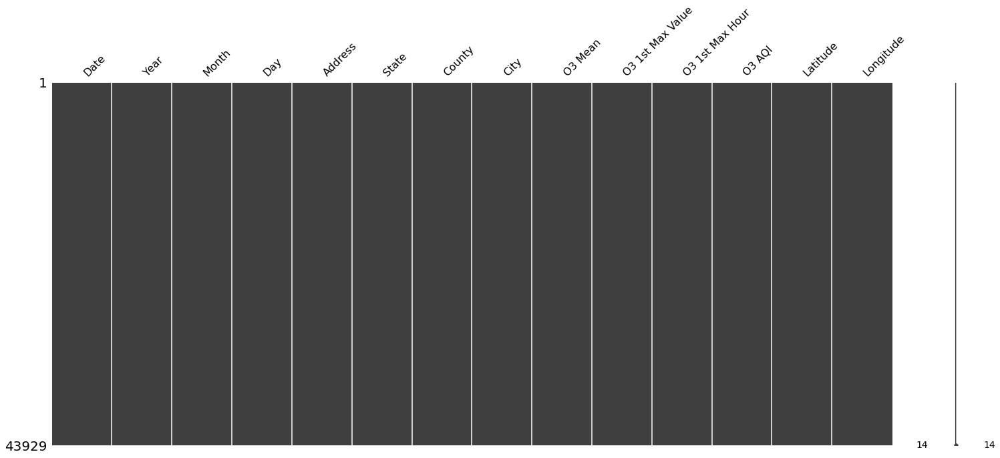

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(O3_api2)

**Observamos que en la columna *Address* tenemos muchos valores nulos que tenemos que reenombrar.**

In [ ]:
O3_api= O3_api.fillna('None Address')

**Para este caso tambien, solo vamos a renombrar con *None Address* los pocos valores nulos (61) para que nuestro DataFrame no lo reconozca como tal.**

In [ ]:
O3_api.isnull().values.any() #Verificamos si aun existen valores nulos

False

#### **Sulfur dioxide (SO2)**

In [ ]:
# Running this code will display the query used to generate your previous job

job = client.get_job('bquxjob_4af37c4c_18545102baa') # Job ID inserted based on the query results selected to explore
print(job.query)

SELECT date_local, address,	latitude, longitude,state_name, county_name, 	city_name, arithmetic_mean, first_max_value, first_max_hour, aqi 	 FROM `pollution-361815.historical_air_quality.so2_daily_summary`
WHERE date_local BETWEEN '2022-01-01' AND '2022-12-31' 


In [ ]:
# Running this code will read results from your previous job

job = client.get_job('bquxjob_4af37c4c_18545102baa') # Job ID inserted based on the query results selected to explore
SO2_api2 = job.to_dataframe()
SO2_api2

,date_local,address,latitude,longitude,state_name,county_name,city_name,arithmetic_mean,first_max_value,first_max_hour,aqi
0,2022-02-23,2019 NY-131,44.965412,-74.875000,New York,St. Lawrence,Not in a city,0.100000,0.2,2,0
1,2022-03-01,2019 NY-131,44.965412,-74.875000,New York,St. Lawrence,Not in a city,1.581818,7.6,22,10
2,2022-02-23,2019 NY-131,44.965412,-74.875000,New York,St. Lawrence,Not in a city,0.100000,0.1,2,<NA>
3,2022-03-01,2019 NY-131,44.965412,-74.875000,New York,St. Lawrence,Not in a city,1.733333,5.0,23,<NA>
4,2022-03-15,2019 NY-131,44.965412,-74.875000,New York,St. Lawrence,Not in a city,1.000000,2.7,5,<NA>
...,...,...,...,...,...,...,...,...,...,...,...
40805,2022-03-25,2011 Irving Avenue (Irving St),32.836602,-79.956983,South Carolina,Charleston,North Charleston,0.204167,0.4,12,0
40806,2022-03-27,2011 Irving Avenue (Irving St),32.836602,-79.956983,South Carolina,Charleston,North Charleston,0.166667,0.4,9,0
40807,2022-03-28,2011 Irving Avenue (Irving St),32.836602,-79.956983,South Carolina,Charleston,North Charleston,0.262500,0.6,4,0
40808,2022-03-30,2011 Irving Avenue (Irving St),32.836602,-79.956983,South Carolina,Charleston,North Charleston,0.129167,0.4,7,0


In [ ]:
SO2_api2.info() #Verificamos como está compuesto el DataFrame

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40810 entries, 0 to 40809
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   date_local       40810 non-null  dbdate 
 1   address          40810 non-null  object 
 2   latitude         40810 non-null  float64
 3   longitude        40810 non-null  float64
 4   state_name       40810 non-null  object 
 5   county_name      40810 non-null  object 
 6   city_name        40810 non-null  object 
 7   arithmetic_mean  40810 non-null  float64
 8   first_max_value  40810 non-null  float64
 9   first_max_hour   40810 non-null  Int64  
 10  aqi              20416 non-null  Int64  
dtypes: Int64(2), dbdate(1), float64(4), object(4)
memory usage: 3.5+ MB


In [ ]:
SO2_api2.date_local = pd.to_datetime(SO2_api2.date_local, format="%Y.%m.%d") #Se cambia tipo de dato de columna "Date" a datatime
SO2_api2['Year'] = SO2_api2['date_local'].dt.year #Creamos columna de año que luego utilizaremos 
SO2_api2['Month'] = SO2_api2['date_local'].dt.month #Creamos columna de mes que luego utilizaremos
SO2_api2['Day'] = SO2_api2['date_local'].dt.day #Creamos columna de dia que luego utilizaremos

In [ ]:
SO2_api2= SO2_api2[['date_local',	'Year', 'Month',	'Day', 'address','state_name',	'county_name',	'city_name',	'arithmetic_mean',	'first_max_value',	'first_max_hour',	'aqi',	'latitude', 'longitude']]
#Reordenamos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
SO2_api2.columns = ['Date','Year','Month','Day', 'Address','State','County','City','SO2 Mean','SO2 1st Max Value','SO2 1st Max Hour','SO2 AQI','Latitude', 'Longitude']
#Reenombramos las columnas para que coincidan con nuestro DataFrame original

In [ ]:
print('La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: \n', SO2_api2.count())

La cantidad de valor que NO son NaN en las columnas de nuestro DataFrame es: 
 Date                 40810
Year                 40810
Month                40810
Day                  40810
Address              40810
State                40810
County               40810
City                 40810
SO2 Mean             40810
SO2 1st Max Value    40810
SO2 1st Max Hour     40810
SO2 AQI              20416
Latitude             40810
Longitude            40810
dtype: int64


In [ ]:
SO2_api2.isnull().values.any() #Verificamos si existen valores nulos

True

In [ ]:
SO2_api2.isnull().sum() #Vemos cuantos valores nulos existen

Date                     0
Year                     0
Month                    0
Day                      0
Address                  0
State                    0
County                   0
City                     0
SO2 Mean                 0
SO2 1st Max Value        0
SO2 1st Max Hour         0
SO2 AQI              20394
Latitude                 0
Longitude                0
dtype: int64

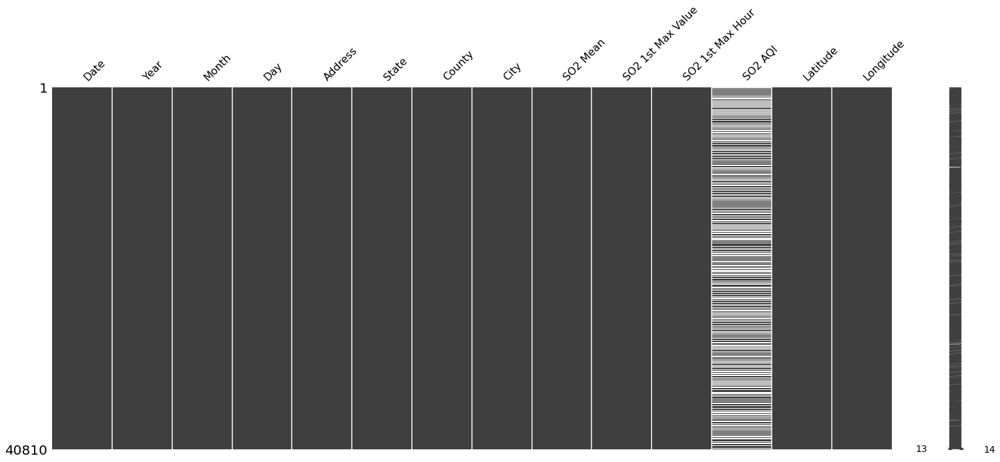

In [ ]:
import missingno as msno # Permite obtener un resumen visual rápido de la integridad en el conjunto de datos y observar los valores nulos

%matplotlib inline
msno.matrix(SO2_api2)

**Observamos que en la columna *SO2 AQI* tenemos muchos valores nulos, los cuales no vamos tratar ya que solos los interesa las variables *SO2 Mean* y
*SO2 1st Max Value* para nuestro modelo de clasificación.**

### **DATA WRANGLING**

In [ ]:
dw2 = pd.merge(CO_api2,NO2_api2, on =['Date', 'Year', 'Month', 'Day', 'Address','State', 'County', 'City','Latitude', 'Longitude'],how= 'inner') 
# Unimos los dataframe CO_api2 y NO2_api2 mediante un inner 

In [ ]:
dw3 = pd.merge(O3_api2,SO2_api2, on =['Date', 'Year', 'Month', 'Day', 'Address','Latitude', 'Longitude', 'State', 'County', 'City'],how= 'inner')
# Unimos los dataframe O3_api2 y SO2_api2 mediante un inner 

In [ ]:
pollution3 = pd.merge(dw2,dw3, on =['Date', 'Year', 'Month', 'Day', 'Address', 'Latitude', 'Longitude','State', 'County', 'City'],how= 'inner')
pollution3.head(5)
# Unimos los dataframe dw2 y dw3 mediante un inner para obtener nuestro dataframe final 

,Date,Year,Month,Day,Address,State,County,City,CO Mean,CO 1st Max Value,...,NO2 1st Max Hour,NO2 AQI,O3 Mean,O3 1st Max Value,O3 1st Max Hour,O3 AQI,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI
0,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.350000,0.6,...,17,17,0.020353,0.029,10,27,0.783333,1.3,17,<NA>
1,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.350000,0.6,...,17,17,0.020353,0.029,10,27,0.750000,1.8,15,1
2,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.329412,0.4,...,17,17,0.020353,0.029,10,27,0.783333,1.3,17,<NA>
3,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.329412,0.4,...,17,17,0.020353,0.029,10,27,0.750000,1.8,15,1
4,2022-01-02,2022,1,2,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.395652,0.6,...,22,19,0.013294,0.023,8,21,1.042857,1.7,17,<NA>


In [ ]:
pollution3= pollution3[['Date', 'Year', 'Month', 'Day', 'Address', 'State', 'County', 'City',
       'O3 Mean', 'O3 1st Max Value', 'O3 1st Max Hour', 'O3 AQI', 'CO Mean',
       'CO 1st Max Value', 'CO 1st Max Hour', 'CO AQI', 'SO2 Mean',
       'SO2 1st Max Value', 'SO2 1st Max Hour', 'SO2 AQI', 'NO2 Mean',
       'NO2 1st Max Value', 'NO2 1st Max Hour', 'NO2 AQI', 'Latitude', 'Longitude']]
  #Reordenamos las columnas para copiar el mismo formato que nuestro DataFrame original

In [ ]:
pollution3.shape

(14860, 26)

In [ ]:
pollution3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14860 entries, 0 to 14859
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               14860 non-null  datetime64[ns]
 1   Year               14860 non-null  int64         
 2   Month              14860 non-null  int64         
 3   Day                14860 non-null  int64         
 4   Address            14860 non-null  object        
 5   State              14860 non-null  object        
 6   County             14860 non-null  object        
 7   City               14860 non-null  object        
 8   O3 Mean            14860 non-null  float64       
 9   O3 1st Max Value   14860 non-null  float64       
 10  O3 1st Max Hour    14860 non-null  Int64         
 11  O3 AQI             14860 non-null  Int64         
 12  CO Mean            14860 non-null  float64       
 13  CO 1st Max Value   14860 non-null  float64       
 14  CO 1st

In [ ]:
pollution3.isnull().values.any() #Verificamos si existen valores nulos

True

**Como era de esperarse tenemos valores nulos, pero no nos importa ya que son otras variables las que vamos a utilizar**

**Podemos observar que ya tenemos el dataframe *pollution3* con el mismo formato y estructura que nuestro dataframe original.**

**Por lo tanto ya podemos usarlo para probar nuestro modelo de clasificación...**


In [ ]:
pollution3.to_csv('pollution3.csv', index=False) #Descargamos el dataframe en formato .csv

**LO DESCARGAMOS PARA SUBIRLO A GITHUB Y FACILITAR LA IMPORTACIÓN EN NUESTRO PROYECTO.**

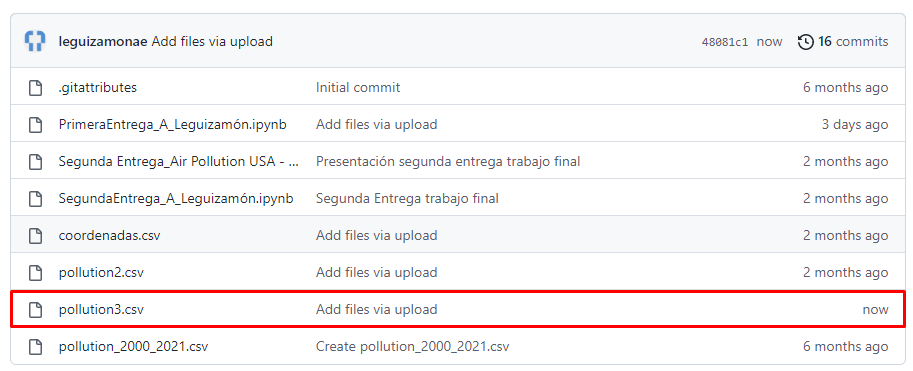

**Chequeamos importando el mismo Dataset pero directamente de Github**

In [ ]:
url = 'https://raw.githubusercontent.com/leguizamonae/Pollution/main/pollution3.csv' #Importamos Dataset cargado en Github
pollution3= pd.read_csv(url,sep=',')
pollution3.head()

,Date,Year,Month,Day,Address,State,County,City,O3 Mean,O3 1st Max Value,...,SO2 Mean,SO2 1st Max Value,SO2 1st Max Hour,SO2 AQI,NO2 Mean,NO2 1st Max Value,NO2 1st Max Hour,NO2 AQI,Latitude,Longitude
0,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.020353,0.029,...,0.783333,1.3,17,NaN,8.518182,18.5,17,17,37.9604,-122.356811
1,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.020353,0.029,...,0.750000,1.8,15,1.0,8.518182,18.5,17,17,37.9604,-122.356811
2,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.020353,0.029,...,0.783333,1.3,17,NaN,8.518182,18.5,17,17,37.9604,-122.356811
3,2022-01-01,2022,1,1,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.020353,0.029,...,0.750000,1.8,15,1.0,8.518182,18.5,17,17,37.9604,-122.356811
4,2022-01-02,2022,1,2,"1865 D RUMRILL BLVD, San Pablo",California,Contra Costa,San Pablo,0.013294,0.023,...,1.042857,1.7,17,NaN,10.100000,20.8,22,19,37.9604,-122.356811


In [ ]:
pollution3.shape #Chequeamos que tenga la misma forma

(14860, 26)